# This notebook is for importing the OSM POIs to the final VFM df

After running a code for more than 8 hours with about half the progress being done we canceled the run and tried a different method of fetching

In [0]:
# imports
import pyspark.sql.functions as F


# Inputs

In [0]:
# Your listings DF (must have: lat, long, city)
LISTINGS_TABLE = spark.table("us_filtered_vfm")
LAT_COL = "lat"
LON_COL = "long"
CITY_COL = "city"

# print shape
print(LISTINGS_TABLE.count(), len(LISTINGS_TABLE.columns))

# Where to put OSM files
OSM_DIR = "/dbfs/tmp/osm"          # driver-local path (DBFS mount)
OUT_DIR = "/dbfs/tmp/osm_out"

# Choose Geofabrik subregions (recommended vs downloading full US)
# Pick the ones that cover your 94 cities (you can start with all 4 to keep it simple).
GEOFABRIK_URLS = [
    "https://download.geofabrik.de/north-america/us/northeast-latest.osm.pbf",
    "https://download.geofabrik.de/north-america/us/south-latest.osm.pbf",
    "https://download.geofabrik.de/north-america/us/midwest-latest.osm.pbf",
    "https://download.geofabrik.de/north-america/us/west-latest.osm.pbf",
]


116572 35


In [0]:
RADIUS_M = 300.0

LISTINGS_TABLE = "us_filtered_vfm"
ID_COL = "property_id"   # change if needed
LAT_COL = "lat"
LON_COL = "long"

PBF_DIR_DBFS = "dbfs:/FileStore/osm_raw_archive"        # where you copied the 4 pbfs
OUT_DIR_DBFS = "dbfs:/FileStore/osm_pipeline"           # outputs persisted here
FILTERED_PBF_DIR = f"{OUT_DIR_DBFS}/filtered_pbf"
JSONL_DIR = f"{OUT_DIR_DBFS}/jsonl"


Install Osmium to import OSM data

In [0]:
%sh
set -e
mkdir -p /dbfs/tmp/osm /dbfs/tmp/osm_out

# Install osmium-tool (fast PBF filtering/export)
if ! command -v osmium >/dev/null 2>&1; then
  sudo apt-get update -y
  sudo apt-get install -y osmium-tool
fi

osmium --version


Get:1 https://repos.azul.com/zulu/deb stable InRelease [6,538 B]
Get:2 http://archive.ubuntu.com/ubuntu jammy InRelease [270 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 https://repos.azul.com/zulu/deb stable/main arm64 Packages [335 kB]
Get:7 https://repos.azul.com/zulu/deb stable/main amd64 Packages [496 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy/universe amd64 Packages [17.5 MB]
Get:9 http://archive.ubuntu.com/ubuntu jammy/restricted amd64 Packages [164 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy/main amd64 Packages [1,792 kB]
Get:11 http://archive.ubuntu.com/ubuntu jammy/multiverse amd64 Packages [266 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [4,009 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/multiverse amd64 Packages [70.9 kB]
Get:14 http

W: https://repos.azul.com/zulu/deb/dists/stable/InRelease: Key is stored in legacy trusted.gpg keyring (/etc/apt/trusted.gpg), see the DEPRECATION section in apt-key(8) for details.


Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  libboost-program-options1.74.0
The following NEW packages will be installed:
  libboost-program-options1.74.0 osmium-tool
0 upgraded, 2 newly installed, 0 to remove and 79 not upgraded.
Need to get 882 kB of archives.
After this operation, 3,863 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libboost-program-options1.74.0 amd64 1.74.0-14ubuntu3 [311 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 osmium-tool amd64 1.14.0-1 [571 kB]


debconf: delaying package configuration, since apt-utils is not installed


Fetched 882 kB in 1s (909 kB/s)
Selecting previously unselected package libboost-program-options1.74.0:amd64.
(Reading database ... 104601 files and directories currently installed.)
Preparing to unpack .../libboost-program-options1.74.0_1.74.0-14ubuntu3_amd64.deb ...
Unpacking libboost-program-options1.74.0:amd64 (1.74.0-14ubuntu3) ...
Selecting previously unselected package osmium-tool.
Preparing to unpack .../osmium-tool_1.14.0-1_amd64.deb ...
Unpacking osmium-tool (1.14.0-1) ...
Setting up libboost-program-options1.74.0:amd64 (1.74.0-14ubuntu3) ...
Setting up osmium-tool (1.14.0-1) ...
Processing triggers for libc-bin (2.35-0ubuntu3.11) ...
Processing triggers for man-db (2.10.2-1) ...
osmium version 1.14.0
libosmium version 2.18.0
Supported PBF compression types: none zlib lz4

Copyright (C) 2013-2022  Jochen Topf <jochen@topf.org>
License: GNU GENERAL PUBLIC LICENSE Version 3 <https://gnu.org/licenses/gpl.html>.
This is free software: you are free to change and redistribute it.
T

Download Geofabrik PBFs 

In [0]:
%sh
set -euo pipefail

OSM_DIR="/dbfs/tmp/osm"
mkdir -p "$OSM_DIR"

# Wipe bad HTML "pbf" files
rm -f "$OSM_DIR"/*-latest.osm.pbf || true

download_one () {
  base="$1"   # us-midwest, us-northeast, us-south, us-west
  url="https://download.geofabrik.de/north-america/${base}-latest.osm.pbf"
  md5url="${url}.md5"

  echo "==== Downloading ${base} ===="
  tmp="/tmp/${base}-latest.osm.pbf"
  tmpmd5="/tmp/${base}-latest.osm.pbf.md5"

  rm -f "$tmp" "$tmpmd5"

  # Download PBF (fail fast on HTTP errors)
  curl -L --fail --retry 20 --retry-delay 5 --connect-timeout 30 \
    -o "$tmp" "$url"

  # Hard guard: HTML means you got an error page
  if file "$tmp" | grep -qi "HTML"; then
    echo "ERROR: Downloaded HTML instead of PBF from: $url"
    head -c 300 "$tmp" | sed 's/[[:cntrl:]]/ /g' | head -n 5
    exit 1
  fi

  # Size guard (real extracts are MB/GB, not KB)
  bytes=$(stat -c%s "$tmp")
  if [ "$bytes" -lt 10000000 ]; then
    echo "ERROR: File too small (${bytes} bytes). Likely a failed download: $url"
    file "$tmp" || true
    exit 1
  fi

  # Try md5 (if exists); if 404, skip checksum but still validate with osmium
  if curl -L -sS -o "$tmpmd5" -w "%{http_code}" "$md5url" | grep -q "^200$"; then
    (cd /tmp && md5sum -c "$(basename "$tmpmd5")")
  else
    echo "WARN: No .md5 found for $base (or blocked). Skipping md5 check."
  fi

  # Move into DBFS + validate structure
  mv "$tmp" "$OSM_DIR/${base}-latest.osm.pbf"
  ls -lh "$OSM_DIR/${base}-latest.osm.pbf"
  osmium fileinfo -e "$OSM_DIR/${base}-latest.osm.pbf" >/dev/null
  echo "OK: ${base}"
}

download_one us-midwest
download_one us-northeast
download_one us-south
download_one us-west

echo "ALL DONE. Files in $OSM_DIR:"
ls -lh "$OSM_DIR" | sed -n '1,200p'


==== Downloading us-midwest ====


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   253  100   253    0     0    468      0 --:--:-- --:--:-- --:--:--   469
100 2259M  100 2259M    0     0  19.2M      0  0:01:57  0:01:57 --:--:-- 19.5M


us-midwest-latest.osm.pbf: OK
-rwxrwxrwx 1 nobody nogroup 2.3G Feb  4 08:13 /dbfs/tmp/osm/us-midwest-latest.osm.pbf
OK: us-midwest
==== Downloading us-northeast ====


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   255  100   255    0     0    422      0 --:--:-- --:--:-- --:--:--   422
100 1663M  100 1663M    0     0  19.1M      0  0:01:26  0:01:26 --:--:-- 19.9M


us-northeast-latest.osm.pbf: OK
-rwxrwxrwx 1 nobody nogroup 1.7G Feb  4 08:16 /dbfs/tmp/osm/us-northeast-latest.osm.pbf
OK: us-northeast
==== Downloading us-south ====


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   251  100   251    0     0    463      0 --:--:-- --:--:-- --:--:--   463
100 3795M  100 3795M    0     0  18.6M      0  0:03:23  0:03:23 --:--:-- 18.2M


us-south-latest.osm.pbf: OK
-rwxrwxrwx 1 nobody nogroup 3.8G Feb  4 08:20 /dbfs/tmp/osm/us-south-latest.osm.pbf
OK: us-south
==== Downloading us-west ====


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   250  100   250    0     0    592      0 --:--:-- --:--:-- --:--:--   592
100 3124M  100 3124M    0     0  19.7M      0  0:02:38  0:02:38 --:--:-- 20.4M


us-west-latest.osm.pbf: OK
-rwxrwxrwx 1 nobody nogroup 3.1G Feb  4 08:24 /dbfs/tmp/osm/us-west-latest.osm.pbf
OK: us-west
ALL DONE. Files in /dbfs/tmp/osm:
total 11G
-rwxrwxrwx 1 nobody nogroup 2.3G Feb  4 08:13 us-midwest-latest.osm.pbf
-rwxrwxrwx 1 nobody nogroup 1.7G Feb  4 08:16 us-northeast-latest.osm.pbf
-rwxrwxrwx 1 nobody nogroup 3.8G Feb  4 08:20 us-south-latest.osm.pbf
-rwxrwxrwx 1 nobody nogroup 3.1G Feb  4 08:24 us-west-latest.osm.pbf


## Save POIs as deltas before continuing

In [0]:
from pyspark.sql import functions as F

# Listings (Delta table)
LISTINGS_DF = spark.table("us_filtered_vfm")

LAT_COL = "lat"
LON_COL = "long"
CITY_COL = "city"
ID_COL  = "property_id"  # change if your id column is different

print("listings rows:", LISTINGS_DF.count(), "cols:", len(LISTINGS_DF.columns))
display(LISTINGS_DF.select(ID_COL, CITY_COL, LAT_COL, LON_COL).limit(5))


listings rows: 116572 cols: 35


property_id,city,lat,long
46396429,Charleston,32.79196,-79.94072
716222205305843423,Charleston,32.7797,-79.9272
713924048243823044,Charleston,32.7797,-79.9272
713925013934899956,Charleston,32.7797,-79.9272
32551892,Charleston,32.77873,-79.97869


In [0]:
# Manifest table (Delta) should exist if the copy succeeded
display(spark.table("osm_raw_pbf_manifest"))

# Persistent archive location (survives restart)
ARCHIVE_DIR = "dbfs:/FileStore/osm_raw_archive"

# Check sizes
files = dbutils.fs.ls(ARCHIVE_DIR)
for f in sorted(files, key=lambda x: x.path):
    if f.path.endswith(".osm.pbf"):
        print(f.path, "bytes=", f.size)


region,path,bytes,saved_at
us-northeast,dbfs:/FileStore/osm_raw_archive/us-northeast-latest.osm.pbf,1744668464,1770195582
us-midwest,dbfs:/FileStore/osm_raw_archive/us-midwest-latest.osm.pbf,2369766114,1770195571
us-south,dbfs:/FileStore/osm_raw_archive/us-south-latest.osm.pbf,3979586874,1770195604
us-west,dbfs:/FileStore/osm_raw_archive/us-west-latest.osm.pbf,3276306816,1770195623


dbfs:/FileStore/osm_raw_archive/us-midwest-latest.osm.pbf bytes= 2369766114
dbfs:/FileStore/osm_raw_archive/us-northeast-latest.osm.pbf bytes= 1744668464
dbfs:/FileStore/osm_raw_archive/us-south-latest.osm.pbf bytes= 3979586874
dbfs:/FileStore/osm_raw_archive/us-west-latest.osm.pbf bytes= 3276306816


In [0]:
ARCHIVE_DIR = "dbfs:/FileStore/osm_raw_archive"   # input pbfs
OUT_DIR_DBFS = "dbfs:/FileStore/osm_pipeline"     # outputs persist here

FILTERED_PBF_DIR = f"{OUT_DIR_DBFS}/filtered_pbf"
JSONL_DIR = f"{OUT_DIR_DBFS}/jsonl"

dbutils.fs.mkdirs(OUT_DIR_DBFS)
dbutils.fs.mkdirs(FILTERED_PBF_DIR)
dbutils.fs.mkdirs(JSONL_DIR)

PBF_PATHS = [
    ("us-midwest",   f"{ARCHIVE_DIR}/us-midwest-latest.osm.pbf"),
    ("us-northeast", f"{ARCHIVE_DIR}/us-northeast-latest.osm.pbf"),
    ("us-south",     f"{ARCHIVE_DIR}/us-south-latest.osm.pbf"),
    ("us-west",      f"{ARCHIVE_DIR}/us-west-latest.osm.pbf"),
]


## Extract & Convert the pbf files

Install osmium on the cluster

In [0]:
%sh
set -e
sudo apt-get update -y
sudo apt-get install -y osmium-tool
which osmium
osmium --version


Get:1 https://repos.azul.com/zulu/deb stable InRelease [6,538 B]
Get:2 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy InRelease [270 kB]
Get:4 https://repos.azul.com/zulu/deb stable/main arm64 Packages [335 kB]
Get:5 https://repos.azul.com/zulu/deb stable/main amd64 Packages [496 kB]
Get:6 http://security.ubuntu.com/ubuntu jammy-security/multiverse amd64 Packages [62.6 kB]
Get:7 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,297 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:10 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [6,388 kB]
Get:11 http://archive.ubuntu.com/ubuntu jammy/multiverse amd64 Packages [266 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy/restricted amd64 Packages [164 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy/main amd64 Packages [

W: https://repos.azul.com/zulu/deb/dists/stable/InRelease: Key is stored in legacy trusted.gpg keyring (/etc/apt/trusted.gpg), see the DEPRECATION section in apt-key(8) for details.


Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  libboost-program-options1.74.0
The following NEW packages will be installed:
  libboost-program-options1.74.0 osmium-tool
0 upgraded, 2 newly installed, 0 to remove and 53 not upgraded.
Need to get 882 kB of archives.
After this operation, 3,863 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libboost-program-options1.74.0 amd64 1.74.0-14ubuntu3 [311 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 osmium-tool amd64 1.14.0-1 [571 kB]


debconf: delaying package configuration, since apt-utils is not installed


Fetched 882 kB in 1s (1,022 kB/s)
Selecting previously unselected package libboost-program-options1.74.0:amd64.
(Reading database ... 104602 files and directories currently installed.)
Preparing to unpack .../libboost-program-options1.74.0_1.74.0-14ubuntu3_amd64.deb ...
Unpacking libboost-program-options1.74.0:amd64 (1.74.0-14ubuntu3) ...
Selecting previously unselected package osmium-tool.
Preparing to unpack .../osmium-tool_1.14.0-1_amd64.deb ...
Unpacking osmium-tool (1.14.0-1) ...
Setting up libboost-program-options1.74.0:amd64 (1.74.0-14ubuntu3) ...
Setting up osmium-tool (1.14.0-1) ...
Processing triggers for libc-bin (2.35-0ubuntu3.11) ...
Processing triggers for man-db (2.10.2-1) ...
/usr/bin/osmium
osmium version 1.14.0
libosmium version 2.18.0
Supported PBF compression types: none zlib lz4

Copyright (C) 2013-2022  Jochen Topf <jochen@topf.org>
License: GNU GENERAL PUBLIC LICENSE Version 3 <https://gnu.org/licenses/gpl.html>.
This is free software: you are free to change and 

In [0]:
%sh
set -euo pipefail

# --- CONFIGURATION ---
# Note: dbfs:/FileStore/... becomes /dbfs/FileStore/... in shell
ARCHIVE_DIR="/dbfs/FileStore/osm_raw_archive"
FILTERED_PBF_DIR="/dbfs/FileStore/osm_pipeline/filtered_pbf"
JSONL_DIR="/dbfs/FileStore/osm_pipeline/jsonl"

# Create directories if they don't exist (shell side)
mkdir -p "$FILTERED_PBF_DIR"
mkdir -p "$JSONL_DIR"

# Filter Expression: Captures all candidates for our 5 categories
FILTER="nwr/amenity nwr/shop nwr/leisure nwr/tourism nwr/historic nwr/natural"

echo "STARTING EXTRACTION PIPELINE..."
echo "Input: $ARCHIVE_DIR"

# Loop through the known regions
for region in us-midwest us-northeast us-south us-west; do
    input_file="$ARCHIVE_DIR/${region}-latest.osm.pbf"
    filtered_file="$FILTERED_PBF_DIR/${region}-filtered.osm.pbf"
    json_file="$JSONL_DIR/${region}.json"

    if [ -f "$input_file" ]; then
        echo "==== Processing $region ===="
        
        # 1. Filter (Reduce size)
        echo "  > Filtering to $filtered_file..."
        osmium tags-filter "$input_file" $FILTER -o "$filtered_file" --overwrite
        
        # 2. Convert to JSONL (Spark ready)
        # --geometry-types=point forces buildings/polygons to centroids
        echo "  > Converting to $json_file..."
        osmium export "$filtered_file" -o "$json_file" -f json --geometry-types=point --overwrite
        
        # 3. Quick sanity check (print first line size)
        size=$(stat -c%s "$json_file")
        echo "  > Done. JSON Size: $((size/1024/1024)) MB"
    else
        echo "WARNING: Input file not found for $region at $input_file"
    fi
done

echo "ALL DONE."
ls -lh "$JSONL_DIR"

STARTING EXTRACTION PIPELINE...
Input: /dbfs/FileStore/osm_raw_archive
==== Processing us-midwest ====
  > Filtering to /dbfs/FileStore/osm_pipeline/filtered_pbf/us-midwest-filtered.osm.pbf...
  > Converting to /dbfs/FileStore/osm_pipeline/jsonl/us-midwest.json...
  > Done. JSON Size: 286 MB
==== Processing us-northeast ====
  > Filtering to /dbfs/FileStore/osm_pipeline/filtered_pbf/us-northeast-filtered.osm.pbf...
  > Converting to /dbfs/FileStore/osm_pipeline/jsonl/us-northeast.json...
  > Done. JSON Size: 216 MB
==== Processing us-south ====
  > Filtering to /dbfs/FileStore/osm_pipeline/filtered_pbf/us-south-filtered.osm.pbf...
  > Converting to /dbfs/FileStore/osm_pipeline/jsonl/us-south.json...
  > Done. JSON Size: 301 MB
==== Processing us-west ====
  > Filtering to /dbfs/FileStore/osm_pipeline/filtered_pbf/us-west-filtered.osm.pbf...
  > Converting to /dbfs/FileStore/osm_pipeline/jsonl/us-west.json...
  > Done. JSON Size: 404 MB
ALL DONE.
total 1.2G
-rwxrwxrwx 1 nobody nogroup  

## Ingestion & Taxonomy (Python)

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import StructType, StructField, LongType, StringType, MapType, ArrayType, DoubleType

# --- 1. CONFIGURATION ---
INPUT_PATH = "dbfs:/FileStore/osm_pipeline/jsonl/*.json"
OUTPUT_TABLE_PATH = "dbfs:/FileStore/osm_pipeline/gold_pois"

# --- 2. CRASH-PROOF SCHEMA DEFINITION ---
# We force 'properties' to be a Map. This prevents "Column Already Exists" errors
# because Spark won't try to make a column for every single tag (like 'authority').
osm_schema = StructType([
    StructField("id", LongType(), True),
    StructField("type", StringType(), True),
    StructField("geometry", StructType([
        StructField("type", StringType(), True),
        StructField("coordinates", ArrayType(DoubleType()), True) # [Lon, Lat]
    ]), True),
    StructField("properties", MapType(StringType(), StringType()), True) # Treat tags as data, not columns
])

# --- 3. CATEGORY LISTS ---
NOISE_VALUES = [
    "manhole", "utility_pole", "bench", "waste_basket", "mast", "surveillance", 
    "street_cabinet", "flagpole", "parking_entrance", "bicycle_parking", 
    "recycling", "telephone", "post_box", "vending_machine", "water_tower", 
    "petroleum_well", "crossing", "traffic_signals", "bus_stop", "street_lamp"
]

FOOD_TAGS = ["restaurant", "cafe", "bar", "pub", "fast_food", "ice_cream", "food_court", "biergarten", "nightclub"]
FOOD_SHOPS = ["bakery", "alcohol", "beverages", "confectionery", "deli", "chocolate", "coffee", "wine"]
ESSENTIAL_SHOPS = ["supermarket", "convenience", "grocery", "pharmacy", "greengrocer", "butcher", "seafood", "chemist", "department_store"]
ESSENTIAL_AMENITIES = ["fuel", "bank", "atm", "post_office", "clinic", "hospital", "charging_station", "police", "doctors"]
OUTDOOR_LEISURE = ["park", "playground", "garden", "nature_reserve", "swimming_pool", "pitch", "golf_course", "dog_park", "fishing", "beach_resort", "marina", "stadium"]
OUTDOOR_TOURISM = ["viewpoint", "camp_site", "picnic_site", "zoo", "theme_park"]
NATURAL_TAGS = ["beach", "peak", "spring", "volcano", "cliff"]
INDOOR_CULTURE = ["museum", "theatre", "cinema", "arts_centre", "library", "casino", "bowling_alley", "aquarium", "planetarium", "community_centre"]
HISTORIC_TAGS = ["memorial", "monument", "castle", "ruins", "fort", "archaeological_site"]

# --- 4. EXECUTION ---
print("1. Loading JSON data with Safe Schema...")
# Note: We enforce the schema on read
df_raw = spark.read.schema(osm_schema).json(INPUT_PATH)

# Extract Columns safely using getItem for Map keys
df_pois = df_raw.select(
    F.col("id").alias("poi_id"),
    F.col("geometry.coordinates")[0].alias("poi_lon"), 
    F.col("geometry.coordinates")[1].alias("poi_lat"),
    # Extract tags safely from the Map
    F.col("properties").getItem("amenity").alias("raw_amenity"),
    F.col("properties").getItem("shop").alias("raw_shop"),
    F.col("properties").getItem("leisure").alias("raw_leisure"),
    F.col("properties").getItem("tourism").alias("raw_tourism"),
    F.col("properties").getItem("historic").alias("raw_historic"),
    F.col("properties").getItem("natural").alias("raw_natural")
).na.drop(subset=["poi_lat", "poi_lon"])

# Create a Main Tag Value for filtering (Coalesce the extracted columns)
df_pois = df_pois.withColumn(
    "main_tag_value",
    F.coalesce(
        F.col("raw_amenity"), F.col("raw_shop"), 
        F.col("raw_leisure"), F.col("raw_tourism"), 
        F.col("raw_historic"), F.col("raw_natural")
    )
)

print(f"   > Parsed {df_pois.count():,} POIs safely.")

# --- 5. CATEGORIZE ---
df_categorized = df_pois.filter(
    ~F.col("main_tag_value").isin(NOISE_VALUES)
).withColumn(
    "poi_category", 
    F.when((F.col("raw_amenity").isin(FOOD_TAGS)) | (F.col("raw_shop").isin(FOOD_SHOPS)), "Food_Drinks")
     .when((F.col("raw_shop").isin(ESSENTIAL_SHOPS)) | (F.col("raw_amenity").isin(ESSENTIAL_AMENITIES)), "Daily_Essentials")
     .when((F.col("raw_leisure").isin(OUTDOOR_LEISURE)) | (F.col("raw_tourism").isin(OUTDOOR_TOURISM)) | (F.col("raw_natural").isin(NATURAL_TAGS)), "Outdoor_Attractions")
     .when((F.col("raw_tourism").isin(["museum", "gallery", "artwork"])) | (F.col("raw_amenity").isin(INDOOR_CULTURE)) | (F.col("raw_historic").isin(HISTORIC_TAGS)), "Indoor_Culture")
     .when((F.col("raw_shop").isNotNull()) & (~F.col("raw_shop").isin(FOOD_SHOPS + ESSENTIAL_SHOPS)), "Shopping")
     .otherwise("Other")
)

print("2. Saving to Delta Lake...")
df_categorized.write.format("delta").mode("overwrite").save(OUTPUT_TABLE_PATH)
print(f"SUCCESS. Saved to: {OUTPUT_TABLE_PATH}")

# Verify
display(df_categorized.groupBy("poi_category").count().orderBy(F.desc("count")))

1. Loading JSON data with Safe Schema...
   > Parsed 7,637,222 POIs safely.
2. Saving to Delta Lake...
SUCCESS. Saved to: dbfs:/FileStore/osm_pipeline/gold_pois


poi_category,count
Other,4884940
Outdoor_Attractions,399071
Shopping,352452
Food_Drinks,317957
Daily_Essentials,199124
Indoor_Culture,98244


### Investigate what Other contains

In [0]:
# Load the table we just created
df_gold = spark.read.format("delta").load("dbfs:/FileStore/osm_pipeline/gold_pois")

print(f"Total 'Other' Count: {df_gold.filter(F.col('poi_category') == 'Other').count():,}")

print("--- TOP 30 UNMAPPED TAGS ---")
# Filter for 'Other' and count the specific tags that caused it
df_gold.filter(F.col("poi_category") == "Other") \
    .groupBy("main_tag_value") \
    .count() \
    .orderBy(F.desc("count")) \
    .show(30, truncate=False)

Total 'Other' Count: 4,884,940
--- TOP 30 UNMAPPED TAGS ---
+----------------+-------+
|main_tag_value  |count  |
+----------------+-------+
|tree            |3760731|
|place_of_worship|147668 |
|picnic_table    |93439  |
|information     |67728  |
|school          |61093  |
|camp_pitch      |59934  |
|parking_space   |54879  |
|waste_disposal  |51295  |
|shrub           |41097  |
|toilets         |38452  |
|parking         |37874  |
|fountain        |30872  |
|grave_yard      |28305  |
|letter_box      |27160  |
|drinking_water  |23305  |
|slipway         |21192  |
|loading_dock    |16111  |
|dentist         |16063  |
|shelter         |14787  |
|fire_station    |14663  |
|fitness_centre  |14216  |
|pharmacy        |14113  |
|water           |10272  |
|attraction      |9653   |
|bay             |9167   |
|bbq             |8914   |
|stone           |8729   |
|firepit         |7942   |
|bicycle_rental  |7400   |
|public_bookcase |6938   |
+----------------+-------+
only showing top 30 ro

We categorized those top 30 to DELETE and the categories above, and then we reran this code again.

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import StructType, StructField, LongType, StringType, MapType, ArrayType, DoubleType

# --- 1. CONFIGURATION ---
INPUT_PATH = "dbfs:/FileStore/osm_pipeline/jsonl/*.json"
OUTPUT_TABLE_PATH = "dbfs:/FileStore/osm_pipeline/gold_pois"

# --- 2. CRASH-PROOF SCHEMA ---
osm_schema = StructType([
    StructField("id", LongType(), True),
    StructField("type", StringType(), True),
    StructField("geometry", StructType([
        StructField("type", StringType(), True),
        StructField("coordinates", ArrayType(DoubleType()), True) 
    ]), True),
    StructField("properties", MapType(StringType(), StringType()), True) 
])

# --- 3. UPDATED LISTS (Based on your feedback) ---

# THE KILL LIST (Added: tree, school, information, camp_pitch, etc.)
NOISE_VALUES = [
    "manhole", "utility_pole", "bench", "waste_basket", "mast", "surveillance", 
    "street_cabinet", "flagpole", "parking_entrance", "bicycle_parking", 
    "recycling", "telephone", "post_box", "vending_machine", "water_tower", 
    "petroleum_well", "crossing", "traffic_signals", "bus_stop", "street_lamp",
    # NEW DECISIONS
    "tree", "shrub", "stone", "information", "school", "camp_pitch", 
    "waste_disposal", "toilets", "grave_yard", "letter_box", "drinking_water", 
    "slipway", "loading_dock", "shelter", "fire_station", "water", "firepit"
]

# FOOD & DRINKS
FOOD_TAGS = ["restaurant", "cafe", "bar", "pub", "fast_food", "ice_cream", "food_court", "biergarten", "nightclub"]
FOOD_SHOPS = ["bakery", "alcohol", "beverages", "confectionery", "deli", "chocolate", "coffee", "wine"]

# DAILY ESSENTIALS (Added: place_of_worship, parking, dentist, fitness, pharmacy fix)
ESSENTIAL_SHOPS = ["supermarket", "convenience", "grocery", "pharmacy", "greengrocer", "butcher", "seafood", "chemist", "department_store"]
ESSENTIAL_AMENITIES = [
    "fuel", "bank", "atm", "post_office", "clinic", "hospital", "charging_station", "police", "doctors",
    # NEW DECISIONS
    "place_of_worship", "parking", "parking_space", "dentist", "fitness_centre", "pharmacy"
]

# OUTDOOR ATTRACTIONS (Added: picnic_table, fountain, bbq, etc.)
OUTDOOR_LEISURE = [
    "park", "playground", "garden", "nature_reserve", "swimming_pool", "pitch", "golf_course", 
    "dog_park", "fishing", "beach_resort", "marina", "stadium",
    # NEW DECISIONS
    "picnic_table", "bicycle_rental", "attraction"
]
OUTDOOR_TOURISM = ["viewpoint", "camp_site", "picnic_site", "zoo", "theme_park", "attraction"]
NATURAL_TAGS = ["beach", "peak", "spring", "volcano", "cliff", "bay", "water"] # Added Bay
OUTDOOR_AMENITIES = ["fountain", "bbq", "public_bookcase", "bicycle_rental"] # Specific amenities acting as outdoor features

# INDOOR CULTURE
INDOOR_CULTURE = ["museum", "theatre", "cinema", "arts_centre", "library", "casino", "bowling_alley", "aquarium", "planetarium", "community_centre"]
HISTORIC_TAGS = ["memorial", "monument", "castle", "ruins", "fort", "archaeological_site"]

# --- 4. EXECUTION ---
print("1. Loading and Filtering...")
df_raw = spark.read.schema(osm_schema).json(INPUT_PATH)

df_pois = df_raw.select(
    F.col("id").alias("poi_id"),
    F.col("geometry.coordinates")[0].alias("poi_lon"), 
    F.col("geometry.coordinates")[1].alias("poi_lat"),
    F.col("properties").getItem("amenity").alias("raw_amenity"),
    F.col("properties").getItem("shop").alias("raw_shop"),
    F.col("properties").getItem("leisure").alias("raw_leisure"),
    F.col("properties").getItem("tourism").alias("raw_tourism"),
    F.col("properties").getItem("historic").alias("raw_historic"),
    F.col("properties").getItem("natural").alias("raw_natural")
).na.drop(subset=["poi_lat", "poi_lon"])

# Create Main Tag for Noise Filtering
df_pois = df_pois.withColumn(
    "main_tag_value",
    F.coalesce(F.col("raw_amenity"), F.col("raw_shop"), F.col("raw_leisure"), F.col("raw_tourism"), F.col("raw_historic"), F.col("raw_natural"))
)

# --- 5. CATEGORIZE ---
df_categorized = df_pois.filter(
    ~F.col("main_tag_value").isin(NOISE_VALUES)
).withColumn(
    "poi_category", 
    F.when((F.col("raw_amenity").isin(FOOD_TAGS)) | (F.col("raw_shop").isin(FOOD_SHOPS)), "Food_Drinks")
     .when((F.col("raw_shop").isin(ESSENTIAL_SHOPS)) | (F.col("raw_amenity").isin(ESSENTIAL_AMENITIES)), "Daily_Essentials")
     .when(
         (F.col("raw_leisure").isin(OUTDOOR_LEISURE)) | 
         (F.col("raw_tourism").isin(OUTDOOR_TOURISM)) | 
         (F.col("raw_natural").isin(NATURAL_TAGS)) |
         (F.col("raw_amenity").isin(OUTDOOR_AMENITIES)), # Added check for amenities like fountains/bbq
         "Outdoor_Attractions"
     )
     .when((F.col("raw_tourism").isin(["museum", "gallery", "artwork"])) | (F.col("raw_amenity").isin(INDOOR_CULTURE)) | (F.col("raw_historic").isin(HISTORIC_TAGS)), "Indoor_Culture")
     .when((F.col("raw_shop").isNotNull()) & (~F.col("raw_shop").isin(FOOD_SHOPS + ESSENTIAL_SHOPS)), "Shopping")
     .otherwise("Other")
)

print("2. Saving to Delta Lake (Overwrite)...")
df_categorized.write.format("delta").mode("overwrite").save(OUTPUT_TABLE_PATH)
print("Done.")

1. Loading and Filtering...
2. Saving to Delta Lake (Overwrite)...
Done.


In [0]:

# Verify
display(df_categorized.groupBy("poi_category").count().orderBy(F.desc("count")))

poi_category,count
Outdoor_Attractions,564449
Daily_Essentials,469830
Shopping,352078
Food_Drinks,317957
Other,195093
Indoor_Culture,97761


**We reduced Other from ~4,8M to ~195K and now will drop that col**

## The Spatial Join (Grid Method) and Dropping of "Other" category

In [0]:
from pyspark.sql import functions as F

# --- 1. CONFIGURATION ---
GOLD_POIS_PATH = "dbfs:/FileStore/osm_pipeline/gold_pois"
listings_df = spark.table("us_filtered_vfm")

# Grid Size: 0.01 degrees is roughly 1.1km. 
# A 3x3 search of these grids covers a 1.5km radius, safely catching our 500m target.
GRID_SIZE = 0.01 

# --- 2. LOAD & PREPARE POIS ---
print("1. Loading Gold POIs...")
df_gold = spark.read.format("delta").load(GOLD_POIS_PATH)

# Drop 'Other' and calculate Grid ID
df_pois_grid = df_gold.filter(F.col("poi_category") != "Other").withColumn(
    "grid_x", (F.col("poi_lon") / GRID_SIZE).cast("long"),
).withColumn(
    "grid_y", (F.col("poi_lat") / GRID_SIZE).cast("long")
)

print(f"   > POIs ready: {df_pois_grid.count():,}")

# --- 3. PREPARE LISTINGS (Generate Search Space) ---
print("2. Generating Search Grids for Listings...")

# Assign Listings to a Grid
listings_grid = listings_df.withColumn(
    "grid_x", (F.col("long") / GRID_SIZE).cast("long"),
).withColumn(
    "grid_y", (F.col("lat") / GRID_SIZE).cast("long")
)

# Explode: Create 9 rows per listing (Center grid + 8 neighbors)
# This mimics the "K-Ring" logic but with squares
listings_exploded = listings_grid.withColumn(
    "dx", F.explode(F.array([F.lit(-1), F.lit(0), F.lit(1)]))
).withColumn(
    "dy", F.explode(F.array([F.lit(-1), F.lit(0), F.lit(1)]))
).withColumn(
    "search_x", F.col("grid_x") + F.col("dx")
).withColumn(
    "search_y", F.col("grid_y") + F.col("dy")
)

# --- 4. SPATIAL JOIN & FILTER ---
print("3. Executing Spatial Join (Box Partitioning)...")

# Join on Integer Grid IDs (Extremely Fast)
joined_df = listings_exploded.alias("l") \
    .join(
        df_pois_grid.alias("p"), 
        (F.col("l.search_x") == F.col("p.grid_x")) & 
        (F.col("l.search_y") == F.col("p.grid_y"))
    ) \
    .withColumn(
        "dist_meters", 
        # Manual Haversine Implementation (Native Spark Math)
        # This works on ALL Spark versions without libraries
        F.lit(111139) * F.sqrt(
            F.pow(F.col("l.lat") - F.col("p.poi_lat"), 2) + 
            F.pow((F.col("l.long") - F.col("p.poi_lon")) * F.cos(F.radians(F.col("l.lat"))), 2)
        )
    ) \
    .filter(F.col("dist_meters") <= 500) # Strict 500m Cutoff

# --- 5. AGGREGATE RESULTS ---
print("4. Aggregating Features...")
final_features = joined_df.groupBy("property_id") \
    .pivot("poi_category", ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]) \
    .count() \
    .na.fill(0)

# Display & Save
display(final_features)
final_features.write.mode("overwrite").saveAsTable("airbnb_poi_features_final")

1. Loading Gold POIs...
   > POIs ready: 1,802,075
2. Generating Search Grids for Listings...
3. Executing Spatial Join (Box Partitioning)...
4. Aggregating Features...


property_id,Food_Drinks,Daily_Essentials,Outdoor_Attractions,Indoor_Culture,Shopping
1170969685160389945,42,9,2,8,38
38020500,17,5,0,26,3
1046466976708478998,4,11,0,8,4
1001417619012615046,2,5,0,0,2
808145194777557720,1,5,2,2,0
713931865463993698,9,6,0,4,1
1308906672100388569,40,15,2,3,18
39532419,24,9,3,0,13
557900620775995625,23,2,14,5,62
22927460,0,1,1,0,0


In [0]:
final_features.write.mode("overwrite").saveAsTable("airbnb_poi_features_final")

Converting to Pandas...

--- DESCRIPTIVE STATISTICS ---
       Food_Drinks  Daily_Essentials  ...  Indoor_Culture  Shopping
count     83122.00          83122.00  ...        83122.00  83122.00
mean         14.77              5.66  ...            2.70     10.74
std          37.64             15.23  ...            7.49     30.51
min           0.00              0.00  ...            0.00      0.00
25%           0.00              0.00  ...            0.00      0.00
50%           2.00              2.00  ...            0.00      1.00
75%          12.00              5.00  ...            2.00      7.00
max         471.00           1376.00  ...          135.00    558.00

[8 rows x 5 columns]

--- PLOTTING DISTRIBUTIONS ---


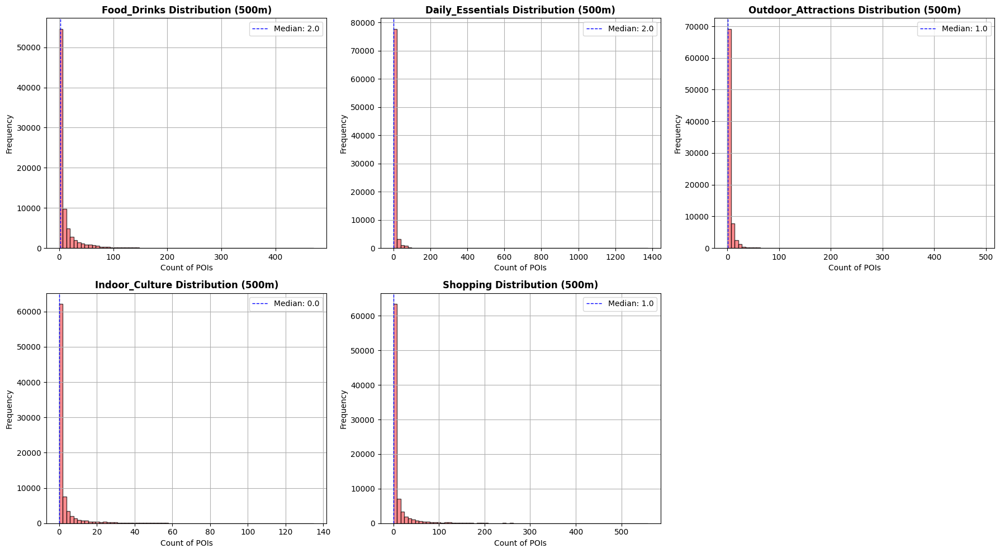

In [0]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Convert to Pandas (This collects data to the driver)
# If your dataset is massive (>2M rows), use .sample(0.1) first, but for Airbnb US it should be fine.
print("Converting to Pandas...")
pdf_features = final_features.toPandas()

# 2. Descriptive Statistics
print("\n--- DESCRIPTIVE STATISTICS ---")
# We exclude the 'id' column to focus on the categories
stats = pdf_features.drop("property_id", axis=1).describe().round(2)
print(stats)

# 3. Plot Histograms
print("\n--- PLOTTING DISTRIBUTIONS ---")
categories = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

# Setup a grid of plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten() # Flatten 2D array to 1D for easy iteration

for i, cat in enumerate(categories):
    ax = axes[i]
    
    # Plot Histogram
    # We use log=True if the data is highly skewed (lots of 0s, few high numbers)
    # But standard linear scale is better to see the true "Zero" problem first.
    pdf_features[cat].hist(bins=70, ax=ax, color='#FF5A5F', edgecolor='black', alpha=0.7)
    
    ax.set_title(f"{cat} Distribution (500m)", fontsize=12, fontweight='bold')
    ax.set_xlabel("Count of POIs")
    ax.set_ylabel("Frequency")
    
    # Add a vertical line for the median
    median_val = pdf_features[cat].median()
    ax.axvline(median_val, color='blue', linestyle='dashed', linewidth=1, label=f'Median: {median_val}')
    ax.legend()

# Remove the 6th empty subplot (since we only have 5 categories)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()

In [0]:
stats

,Food_Drinks,Daily_Essentials,Outdoor_Attractions,Indoor_Culture,Shopping
count,83122.00,83122.00,83122.00,83122.00,83122.00
mean,14.77,5.66,6.26,2.70,10.74
std,37.64,15.23,25.51,7.49,30.51
min,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00
50%,2.00,2.00,1.00,0.00,1.00
75%,12.00,5.00,4.00,2.00,7.00
max,471.00,1376.00,492.00,135.00,558.00


## Integration

In [0]:
# --- CONFIGURATION ---
listings_df = spark.table("us_filtered_vfm")
final_features = spark.table("airbnb_poi_features_final")

# List of the new columns to fill with 0s (in case of no match)
new_feature_cols = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

# --- EXECUTE JOIN ---
print("Merging POI Features into Listings...")

enriched_us_df = listings_df.join(
    final_features, 
    on="property_id", 
    how="left"
).na.fill(0, subset=new_feature_cols)

# --- VERIFY & SAVE ---
print(f"Original Count: {listings_df.count():,}")
print(f"Enriched Count: {enriched_us_df.count():,}")

# Check if columns are added
print("Columns:", enriched_us_df.columns)

# Save the final dataset
display(enriched_us_df)

Merging POI Features into Listings...
Original Count: 116,572
Enriched Count: 116,572
Columns: ['property_id', 'city', 'country', 'lat', 'long', 'name', 'final_url', 'listing_title', 'guests', 'pets_allowed', 'is_supperhost', 'is_guest_favorite', 'price', 'reviews', 'ratings', 'amenities', 'property_number_of_reviews', 'reviews_arr', 'num_reviews_distinct', 'property_number_of_reviews_capped', 'sentiment_multiplier', 'sentiment_boosted_rating', 'city_median_price', 'relativePrice', 'WeightedRating', 'amenitiesCount', 'amenityScore', 'relativePrice_z', 'WeightedRating_z', 'amenityScore_z', 'relativePrice_01', 'WeightedRating_01', 'amenityScore_01', 'baseline_vfm_01', 'baseline_vfm_log', 'Food_Drinks', 'Daily_Essentials', 'Outdoor_Attractions', 'Indoor_Culture', 'Shopping']


property_id city country lat long name final_url listing_title guests pets_allowed is_supperhost is_guest_favorite price reviews ratings amenities property_number_of_reviews reviews_arr num_reviews_distinct property_number_of_reviews_capped sentiment_multiplier sentiment_boosted_rating city_median_price relativePrice WeightedRating amenitiesCount amenityScore relativePrice_z WeightedRating_z amenityScore_z relativePrice_01 WeightedRating_01 amenityScore_01 baseline_vfm_01 baseline_vfm_log Food_Drinks Daily_Essentials Outdoor_Attractions Indoor_Culture Shopping 40257553 Breckenridge United States 39.47879 -106.04395 Condo in Breckenridge · ★4.16 · 1 bedroom · 1 bed · 1 bath https://www.airbnb.com/rooms/40257553?enable_auto_translate=true&locale=en¤cy=USD&source_impression_id=p3_1750147430_P3GkTDEoPH14OdGD 1BR | Walk To Lifts | Balcony | Dog-Friendly 2 true false false 247.0 ["Could’ve been cleaner from the living room previous dog mess to the bedroom sheets. We also couldn’t check in early since they were “cleaning” still. Parking is 0.7 miles away if not more for 24 hr parking. Other than that our stay was fun being so close to Crepes & Starbucks.","Other than pet hair being everywhere, all was good.","It is a wonderful space! Very clean, well equipped, amazing location.","The mattress is really a problem. It feels like a cheap aerobed on top of a box spring. I cannot recommend booking this condo until the mattress is upgraded. I am kind of shocked that after all of the reviews that mention this horrible bed situation, that the host has not done anything to fix this. If you cannot get a good sleep then the other amenities at the condo do not really matter. It is so easy to order a mattress in a box replacement and fix this once and for all. I always regret booking Vacasa properties.","Great location but poor communication. Received wrong parking lot code and violation for parking overnight. Bathroom was LOCKED upon entry and had to call three different people to get someone to come up to unlock it. Management co. needs to communicate with city on who can park in the lot and when.","Location is perfect. There were a handful of minor things that were neglected that were not show stoppers but regular maintenance would prevent.","We had a great time staying here, however there were a few hiccups with the stay. The initial check in instructions were a little unclear on what codes went to what keypads, and the unit took a little to find as there is no indication at the street level of the unit. The unit itself was perfect for 2 people to stay at, however upon arrival, the fireplace was non-functional (it seemed the gas was not on to the unit, we followed all instructions). Otherwise, great location right next to Main Street, and a perfect time of year to be in breck.","We have enjoyed our stay. Thank you!","There is NO functional toilet. Cannot lock door from outside. Hairdryer does not work. Thermostat is slow. The bed is very uncomfortable, and super squeaky. No street lights around parking lot or to the path of the cabin, we had to use our flashlights to make sure we didn’t slip on ice. We attempted to contact the owners to fix some of the issues (the FIRST night) with no response. We proceeded to ask for a $200 partial refund for the issues that we having (before the second night), declined “due to limited time frame” (we had 4 nights there), no problems fixed, and no actual response. We’ve decided to leave early and hope Airbnb support will help us with our problems","Amazing stay, can walk everywhere in town & beautiful views!","LOCATION! This place is a block off of Main St. in the heart of Breckinridge. Close to everything! It's also above a few small businesses so it's a quiet building. Like others have mentioned, it's a bit worn. But overall it was nice and clean with anything we needed. The bed was squeaky but I thought it was comfortable. Not as bad as others made it seem. I came armed and ready with parking instructions

In [0]:
enriched_us_df.write.format("delta").mode("overwrite").saveAsTable("listings_with_poi_features")


## "Robust Q3 Ratio" Implementation to get categories score

--- SCORING COMPLETE ---
         city  Food_Drinks_score  ...  Indoor_Culture_score  Shopping_score
0  Broken Bow                0.0  ...                   0.0             0.0
1  Broken Bow                1.0  ...                   0.0             1.0
2  Broken Bow                0.0  ...                   0.0             0.0
3  Broken Bow                1.0  ...                   0.0             1.0
4  Broken Bow                1.0  ...                   0.0             1.0
5  Broken Bow                0.0  ...                   0.0             0.0
6  Broken Bow                0.0  ...                   0.0             0.0
7  Broken Bow                1.0  ...                   0.0             1.0
8  Broken Bow                0.0  ...                   0.0             0.0
9  Broken Bow                1.0  ...                   0.0             1.0

[10 rows x 6 columns]

--- STATISTICS ---
       Food_Drinks_score  ...  Shopping_score
count      116572.000000  ...   116572.000000
mean

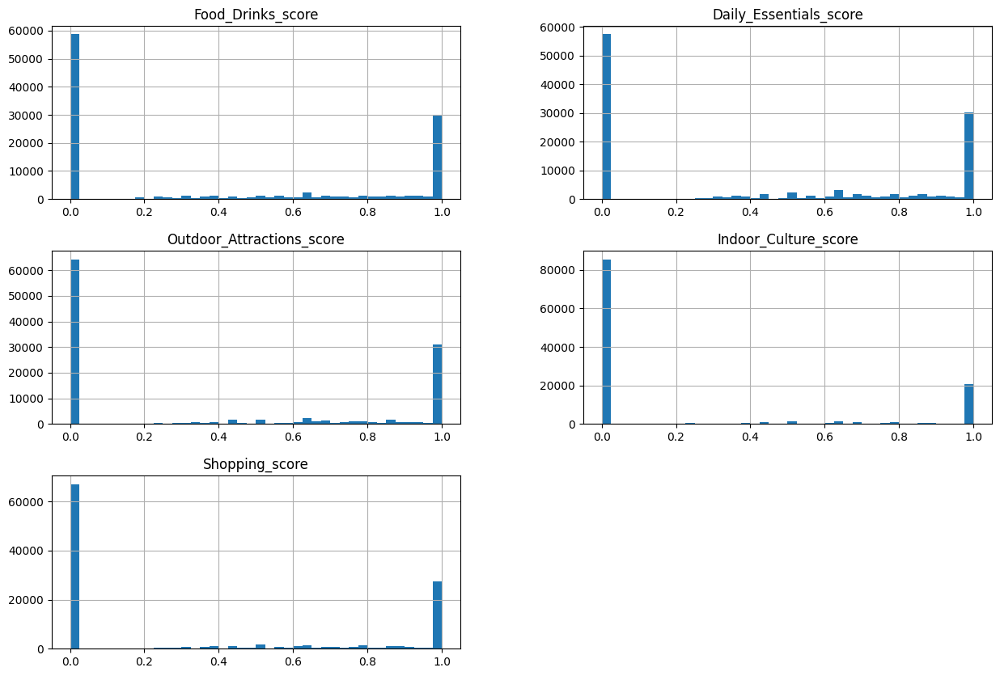

In [0]:
import numpy as np
import pandas as pd

# 1. SETUP
enriched_us_df = spark.table('listings_with_poi_features')
df = enriched_us_df.toPandas() 
categories = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

# 2. STEP 1: LOG TRANSFORM (Smoothing)
# We use log1p (log(x + 1)) so that 0 stays 0.
for cat in categories:
    df[f"log_{cat}"] = np.log1p(df[cat])

# 3. STEP 2: CALCULATE CITY BENCHMARKS (Q3)
# We group by city and find the 75th percentile of the LOGGED counts.
city_benchmarks = df.groupby("city")[[f"log_{cat}" for cat in categories]].quantile(0.75).reset_index()

# Rename columns to keep them distinct
for cat in categories:
    city_benchmarks.rename(columns={f"log_{cat}": f"log_{cat}_Q3"}, inplace=True)

# Merge benchmarks back to the main dataframe
df_scored = pd.merge(df, city_benchmarks, on="city", how="left")

# 4. STEP 3: CALCULATE FINAL SCORES
for cat in categories:
    log_col = f"log_{cat}"
    q3_col = f"log_{cat}_Q3"
    score_col = f"{cat}_score"
    
    # SAFETY CHECK: If a city has NOTHING (Q3=0), we set the divisor to log(2) (~0.69).
    # This means "1 item" becomes the standard for that city.
    # Otherwise, you'd get division by zero errors.
    safe_denominator = df_scored[q3_col].replace(0, np.log1p(1))
    
    # FORMULA: Ratio of (Log Count / City Q3)
    df_scored[score_col] = df_scored[log_col] / safe_denominator
    
    # CAP: Limit the score to 1.0 (The "Gaussian-ish" Cap)
    df_scored[score_col] = df_scored[score_col].clip(upper=1.0)

# 5. VIEW RESULTS
print("--- SCORING COMPLETE ---")
print(df_scored[["city"] + [f"{cat}_score" for cat in categories]].head(10))

print("\n--- STATISTICS ---")
print(df_scored[[f"{cat}_score" for cat in categories]].describe())

# Optional: Histogram to see the new shape
import matplotlib.pyplot as plt
df_scored[[f"{cat}_score" for cat in categories]].hist(bins=40, figsize=(15, 10))
plt.show()

### Count how many completely 0 rows we have category wise

In [0]:
from pyspark.sql import functions as F

# 1. DEFINE ZERO CONDITION
categories = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

# Filter for rows where ALL 5 columns are exactly 0
zero_rows_df = enriched_us_df.filter(
    (F.col("Food_Drinks") == 0) & 
    (F.col("Daily_Essentials") == 0) & 
    (F.col("Outdoor_Attractions") == 0) & 
    (F.col("Indoor_Culture") == 0) & 
    (F.col("Shopping") == 0)
)

# 2. CALCULATE STATS
total_count = enriched_us_df.count()
zero_count = zero_rows_df.count()
percent_loss = (zero_count / total_count) * 100

print(f"--- DAMAGE REPORT ---")
print(f"Total Listings: {total_count:,}")
print(f"Listings with 0 Amenities: {zero_count:,}")
print(f"Potential Data Loss: {percent_loss:.2f}%")

# 3. SEE WHERE THEY ARE
print("\n--- TOP CITIES WITH ZERO AMENITIES ---")
# This tells you if you are deleting entire rural towns
zero_rows_df.groupBy("city").count().orderBy(F.desc("count")).show(10)

--- DAMAGE REPORT ---
Total Listings: 116,572
Listings with 0 Amenities: 33,450
Potential Data Loss: 28.69%

--- TOP CITIES WITH ZERO AMENITIES ---
+-------------+-----+
|         city|count|
+-------------+-----+
|    Kissimmee| 2663|
|      Lahaina| 1790|
|        Kihei| 1789|
|  Sevierville| 1546|
|    Davenport| 1486|
|     Honolulu| 1283|
|Miramar Beach| 1036|
|   Cape Coral|  904|
|       Destin|  865|
|  Kailua-Kona|  780|
+-------------+-----+
only showing top 10 rows



## Drop complete zero category rows (~30% data) to make the final df richer and more usable

Original Count: 116572
Cleaned Count:  83122
Dropped:        33450 rows

--- NEW STATISTICS (Zeros Dropped) ---
       Food_Drinks_score_norm  ...  Shopping_score_norm
count               83122.000  ...            83122.000
mean                    0.346  ...                0.277
std                     0.303  ...                0.293
min                     0.000  ...                0.000
25%                     0.000  ...                0.000
50%                     0.321  ...                0.205
75%                     0.578  ...                0.487
max                     1.000  ...                1.000

[8 rows x 5 columns]


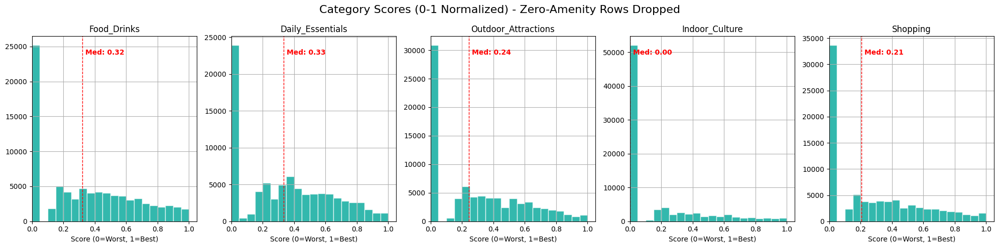

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. SETUP & FILTER
# Use the dataframe from the previous step
df_clean = df.copy()

categories = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

# DROP rows where ALL 5 categories are 0
# "Keep rows where at least one category is > 0"
df_clean = df_clean[~((df_clean[categories] == 0).all(axis=1))].copy()

print(f"Original Count: {len(df)}")
print(f"Cleaned Count:  {len(df_clean)}")
print(f"Dropped:        {len(df) - len(df_clean)} rows")

# 2. RE-CALCULATE LOG-MINMAX SCORES (On Cleaned Data)
for cat in categories:
    # A. Log-Transform
    log_col = f"log_{cat}"
    df_clean[log_col] = np.log1p(df_clean[cat])
    
    # B. Find City Max (Recalculate based on cleaned data)
    city_maxes = df_clean.groupby("city")[log_col].transform("max")
    
    # C. Calculate Score [0, 1]
    score_col = f"{cat}_score_norm"
    
    # Handle divide by zero if a city has max=0 for a specific category (unlikely now, but possible)
    df_clean[score_col] = np.where(
        city_maxes > 0, 
        df_clean[log_col] / city_maxes, 
        0.0
    )

# 3. STATISTICS
print("\n--- NEW STATISTICS (Zeros Dropped) ---")
print(df_clean[[f"{cat}_score_norm" for cat in categories]].describe().round(3))

# 4. PLOT HISTOGRAMS
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
plt.suptitle("Category Scores (0-1 Normalized) - Zero-Amenity Rows Dropped", fontsize=16)

for i, cat in enumerate(categories):
    col_name = f"{cat}_score_norm"
    
    # Plot
    df_clean[col_name].hist(ax=axes[i], bins=20, color='#00A699', edgecolor='white', alpha=0.8)
    
    # Styling
    axes[i].set_title(cat)
    axes[i].set_xlabel("Score (0=Worst, 1=Best)")
    axes[i].set_xlim(0, 1.05)
    
    # Add Median Line
    median = df_clean[col_name].median()
    axes[i].axvline(median, color='red', linestyle='dashed', linewidth=1)
    axes[i].text(median + 0.02, axes[i].get_ylim()[1]*0.9, f'Med: {median:.2f}', color='red', fontweight='bold')

plt.tight_layout()
plt.show()

In [0]:
df_clean[[f"{cat}_score_norm" for cat in categories]].describe().round(3)

,Food_Drinks_score_norm,Daily_Essentials_score_norm,Outdoor_Attractions_score_norm,Indoor_Culture_score_norm,Shopping_score_norm
count,83122.000,83122.000,83122.000,83122.000,83122.000
mean,0.346,0.346,0.294,0.173,0.277
std,0.303,0.289,0.286,0.268,0.293
min,0.000,0.000,0.000,0.000,0.000
25%,0.000,0.000,0.000,0.000,0.000
50%,0.321,0.333,0.245,0.000,0.205
75%,0.578,0.574,0.506,0.304,0.487
max,1.000,1.000,1.000,1.000,1.000


## Save final df to spark

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# --- 1. SETUP ---
# Input: Your master Spark DataFrame from the Integration Step
enriched_us_df = spark.table('listings_with_poi_features')
df_input = enriched_us_df 
OUTPUT_NAME = "dbfs:/FileStore/osm_pipeline/final_listings_scored"

categories = ["Food_Drinks", "Daily_Essentials", "Outdoor_Attractions", "Indoor_Culture", "Shopping"]

print(f"Input Count: {df_input.count():,}")

# --- 2. FILTER GHOST LISTINGS (Drop rows where ALL 5 are 0) ---
# We use the Spark filter syntax here
df_filtered = df_input.filter(
    ~((F.col("Food_Drinks") == 0) & 
      (F.col("Daily_Essentials") == 0) & 
      (F.col("Outdoor_Attractions") == 0) & 
      (F.col("Indoor_Culture") == 0) & 
      (F.col("Shopping") == 0))
)

print(f"Filtered Count: {df_filtered.count():,}")

# --- 3. APPLY LOG-MINMAX SCORING (The Logic we agreed on) ---
# We use a Window to find the max-per-city efficiently in Spark
window_city = Window.partitionBy("city")

df_scored = df_filtered
for cat in categories:
    # A. Log Transform: log(count + 1)
    col_log = f"log_{cat}"
    df_scored = df_scored.withColumn(col_log, F.log1p(F.col(cat)))
    
    # B. Calculate City Max (of the log values)
    col_city_max = f"max_log_{cat}"
    df_scored = df_scored.withColumn(col_city_max, F.max(F.col(col_log)).over(window_city))
    
    # C. Calculate Normalized Score [0, 1]
    # Score = Log_Count / City_Log_Max
    col_score = f"{cat}_score_norm"
    df_scored = df_scored.withColumn(
        col_score, 
        F.when(F.col(col_city_max) > 0, F.col(col_log) / F.col(col_city_max))
         .otherwise(0.0) # If city max is 0, score is 0
    )
    
    # Cleanup: Drop temp columns
    df_scored = df_scored.drop(col_log, col_city_max)

# --- 4. SAVE TO DELTA ---
print("Saving Final Scored Dataset to Delta Lake...")
df_scored.write.format("delta").mode("overwrite").save(OUTPUT_PATH)

print(f"SUCCESS. Saved to: {OUTPUT_PATH}")

# Preview the final scores
display(df_scored.select("property_id", "city", *[f"{cat}_score_norm" for cat in categories]))

Input Count: 116,572
Filtered Count: 83,122
Saving Final Scored Dataset to Delta Lake...
SUCCESS. Saved to: dbfs:/FileStore/osm_pipeline/final_listings_scored


property_id,city,Food_Drinks_score_norm,Daily_Essentials_score_norm,Outdoor_Attractions_score_norm,Indoor_Culture_score_norm,Shopping_score_norm
1273213086006495797,Austin,0.6291616602063046,0.5528664994461185,0.0,0.5169298529844585,0.5184668904238564
1067583374988906041,Austin,0.27817090439708125,0.2920908898423572,0.0,0.0,0.14987054163194743
1065915272438128638,Austin,0.8345127131912436,0.8094550526626301,0.5,0.6939383590404258,0.7044574464661238
1309464507627970178,Austin,0.0,0.0,0.3065735963827292,0.0,0.0
872496121796497229,Austin,0.0,0.0,0.0,0.31122278280498794,0.0
1133452982199982482,Austin,0.6011173234469859,0.6121942524106966,0.1934264036172708,0.46683417420748186,0.4750783768988111
1278991527445880558,Austin,0.0,0.0,0.0,0.31122278280498794,0.0
1278977186242936336,Austin,0.3229464190499047,0.2920908898423572,0.1934264036172708,0.3613184615819645,0.14987054163194743
1121050337481058243,Austin,0.13908545219854063,0.18428883314870617,0.0,0.15561139140249397,0.0
1041517968661388119,Austin,0.27817090439708125,0.36857766629741234,0.1934264036172708,0.0,0.14987054163194743


--------------------------------------